In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)

device= cpu


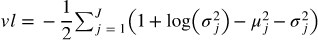

In [2]:
def variational_loss(mu, std):
    vl=-0.5*torch.sum(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the variational loss from arguments mean and standard deviation std
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

Porównanie naszego "variational loss" ze zwykłym błędem średniokwadratowym dla mi=0 i std=1

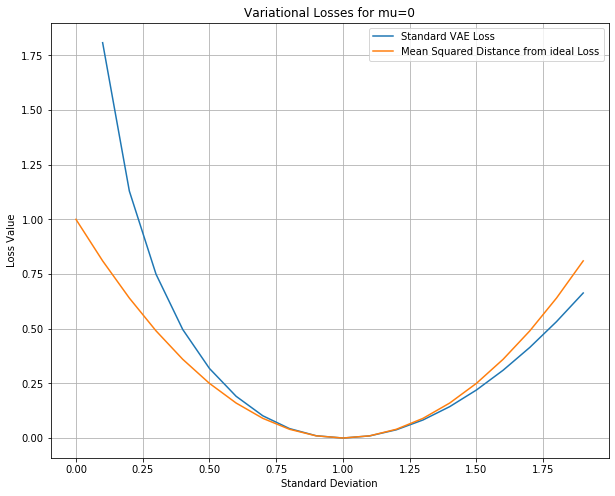

In [3]:
std=np.arange(0,20)
vloss=torch.zeros(std.shape)
vloss2=torch.zeros(std.shape)
for std_ in std:
    vloss[std_]=variational_loss(torch.tensor([0.0]),torch.tensor(0.1*std_))
    vloss2[std_]=variational_loss2(torch.tensor([0.0]),torch.tensor([0.1*std_]))

plt.figure(figsize=(10,8))
plt.plot(0.1*std,np.array(vloss))
plt.plot(0.1*std,np.array(vloss2))
plt.ylabel('Loss Value')
plt.xlabel('Standard Deviation')
plt.title('Variational Losses for mu=0')
plt.legend(('Standard VAE Loss', 'Mean Squared Distance from ideal Loss'))
plt.grid()

Tutaj widzimy, że obie funkcje straty mają to samo minimum na std=1. Widzimy jednak, że standardowa strata VAE ma bardziej stromy wzrost w kierunku niższych wariancji i mniejszy wzrost w kierunku wyższych wariancji.

Mamy teraz do przeszkolenia dwa wyjścia sieciowe:

Yencmean=model.encodermean(X), który odpowiada naszemu koderowi, oraz
Yencstd=model.encoderstd(X), który po prostu generuje aktualnie „dopuszczalne” odchylenie standardowe dla każdego „średniego” wyniku podczas procesu uczenia.

Nasza funkcja straty składa się z dwóch składników, dlatego łączymy je w pętli treningowej za pomocą „mnożnika Lagrange'a”, aby połączyć je w ogólną wartość straty.

Mnożnik Lagrange'a po prostu waży dwa składniki, aby osiągnąć pożądany kompromis między nimi. W naszym przypadku wygląda to tak:

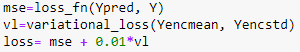

gdzie współczynnik "0,01" to nasz mnożnik Lagrange'a.

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import scipy.io.wavfile as wav

In [5]:
import pickle
   
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)   

device= cpu


In [6]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    
    X = np.expand_dims(x, axis=0)  
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  
    return X

In [7]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        self.conv1mean=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)
        self.conv1std=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)
        
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True)

    def encodermean(self, x):
        x = self.conv1mean(x)
        y = torch.tanh(x)
        return y
      
    def encoderstd(self, x):
        x = self.conv1std(x)
        y = torch.abs(torch.tanh(x))
        return y
      
    def decoder(self, y):
        xrek= self.synconv1(y)
        return xrek
      
    def forward(self, x):
        Yencmean=model.encodermean(x)
        Yencstd=model.encoderstd(x)
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
        return Ypred, Yencmean, Yencstd

In [8]:
import librosa

W naszym programie korzystamy z plików dźwiękowych, do których następnie dokładany jest szum.

In [9]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [10]:
Ypred, Yencmean, Yencstd = model(X)
    
outputlen=len(Ypred[0,0,:]) 
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))

randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 4.6740e-05,  5.1414e-04,  4.6740e-04,  ..., -1.8229e-03,
          -2.2435e-03, -1.9163e-03]],

        [[ 2.2972e-03,  3.3140e-02,  7.2711e-02,  ..., -1.1406e-02,
          -4.9939e-04,  4.9340e-03]]])
Y.type()= torch.FloatTensor


In [11]:
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

In [12]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        Yencmean=model.encodermean(X)
          
        Yencstd=model.encoderstd(X)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        vl=variational_loss(Yencmean, Yencstd)
        loss= mse + 0.01*vl
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.011201527900993824 variational loss= 3.417881727218628
10 mse= 0.010982981882989407 variational loss= 2.279067039489746
20 mse= 0.010302521288394928 variational loss= 1.9353395700454712
30 mse= 0.009501554071903229 variational loss= 1.7455027103424072
40 mse= 0.008567766286432743 variational loss= 1.6180305480957031
50 mse= 0.00786484032869339 variational loss= 1.5213189125061035
60 mse= 0.007355043664574623 variational loss= 1.4441219568252563
70 mse= 0.006971000228077173 variational loss= 1.3784862756729126
80 mse= 0.006396973039954901 variational loss= 1.323436975479126
90 mse= 0.005957722198218107 variational loss= 1.2730708122253418
100 mse= 0.00572393462061882 variational loss= 1.2298500537872314
110 mse= 0.0053967866115272045 variational loss= 1.190071940422058
120 mse= 0.005248526111245155 variational loss= 1.1550421714782715
130 mse= 0.005053181201219559 variational loss= 1.122401237487793
140 mse= 0.004862230736762285 variational loss= 1.0936660766601562
150 mse= 0.0

1220 mse= 0.003920025657862425 variational loss= 0.5086987614631653
1230 mse= 0.004024337977170944 variational loss= 0.5072747468948364
1240 mse= 0.004269717261195183 variational loss= 0.5059459805488586
1250 mse= 0.004105567000806332 variational loss= 0.5049306154251099
1260 mse= 0.003699385328218341 variational loss= 0.5035925507545471
1270 mse= 0.0042319102212786674 variational loss= 0.5020995140075684
1280 mse= 0.004041475243866444 variational loss= 0.5014673471450806
1290 mse= 0.004258569795638323 variational loss= 0.500238299369812
1300 mse= 0.0037998708430677652 variational loss= 0.4987563490867615
1310 mse= 0.0037832348607480526 variational loss= 0.4975958466529846
1320 mse= 0.003838025266304612 variational loss= 0.49618589878082275
1330 mse= 0.003773612668737769 variational loss= 0.4947117269039154
1340 mse= 0.00418971898034215 variational loss= 0.4936120808124542
1350 mse= 0.003886995604261756 variational loss= 0.4927586317062378
1360 mse= 0.004145667422562838 variational los

MSE= 0.004110678564757109 Variational Loss: 0.43348321318626404
ww= OrderedDict([('conv1mean.weight', tensor([[[ 0.0037, -0.0031,  0.0073,  ..., -0.0045, -0.0063, -0.0010]],

        [[-0.0086, -0.0006, -0.0025,  ..., -0.0033, -0.0039, -0.0011]],

        [[ 0.0009,  0.0063, -0.0075,  ..., -0.0028,  0.0004,  0.0156]],

        ...,

        [[ 0.0062,  0.0096, -0.0026,  ..., -0.0066, -0.0009,  0.0061]],

        [[ 0.0057,  0.0002,  0.0032,  ..., -0.0011, -0.0036, -0.0098]],

        [[-0.0051, -0.0017,  0.0075,  ..., -0.0036, -0.0042,  0.0030]]])), ('conv1mean.bias', tensor([ 5.9772e-03,  1.7647e-03,  2.8313e-03,  1.3130e-03, -8.1829e-06,
         4.5988e-03,  4.0866e-03,  6.2433e-05,  1.8869e-03,  6.6228e-03,
         2.9525e-03, -6.0209e-03, -2.4838e-03,  1.5418e-03, -8.6689e-03,
        -2.6079e-03, -1.2775e-03, -2.2766e-03,  1.1856e-03, -9.0520e-03,
         3.3786e-03,  6.5497e-03,  2.7465e-03,  3.5029e-03,  4.5067e-03,
        -5.0596e-03,  7.0848e-03, -4.7483e-03,  3.0326e-03, 

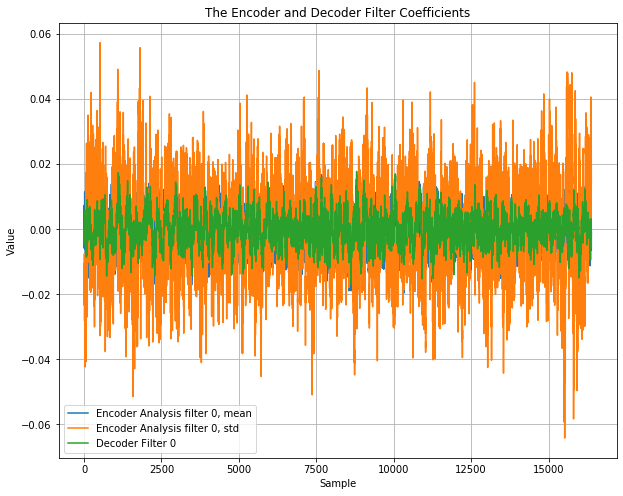

In [13]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

Po nauczeniu program najpierw wyświetla wagi autoenkodera i dekodera, a następnie rysuje wykres współczynników filtrowania enkodera i dekodera.

In [14]:
#Test on training set:
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
print("predictions.shape=", predictions.shape)

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [15]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


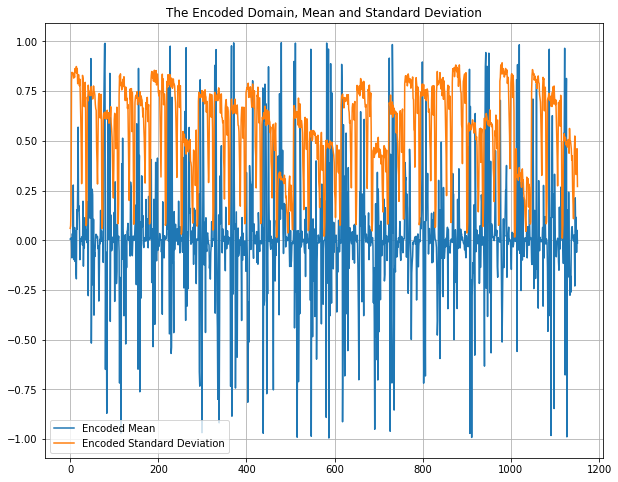

D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


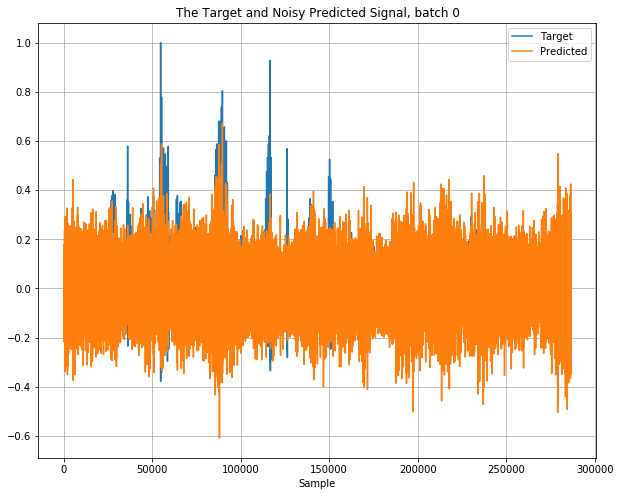

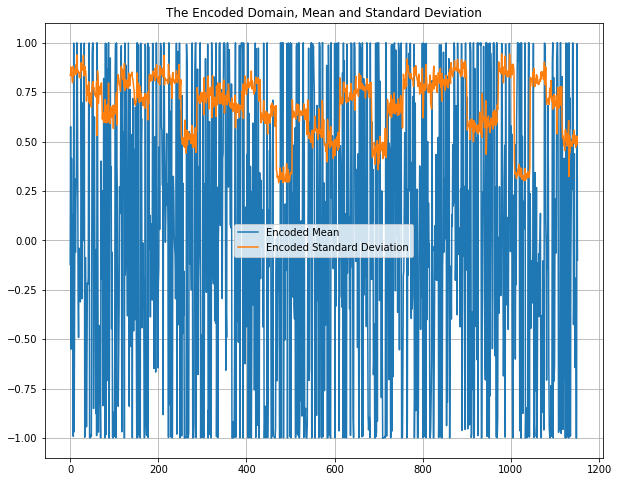

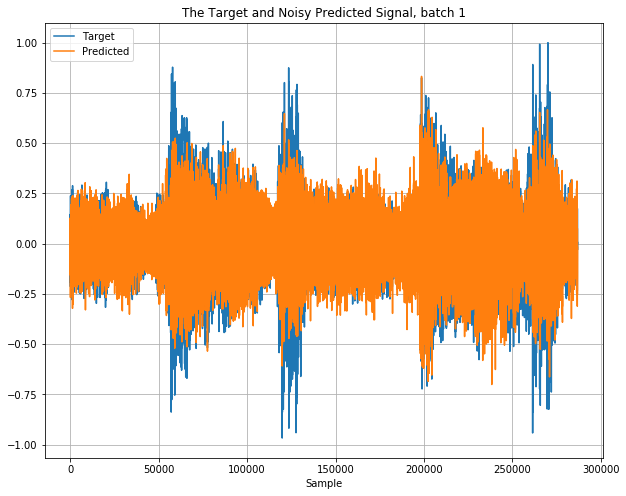

In [16]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

Wykorzystanie funkcji <br>
vl=variational_loss2(Yencmean, Yencstd)

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


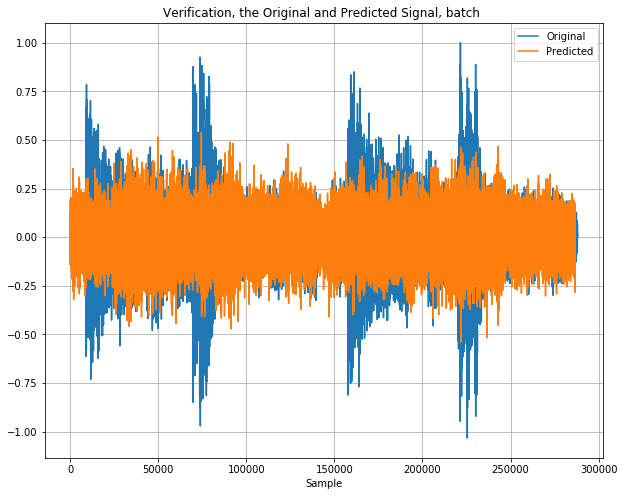

In [17]:
#Test on Verification set:
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational)
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) 
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

In [18]:
#make training set with batch of 2 speech signals:
batch=2;
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device)     
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [19]:
Ypred, Yencmean, Yencstd = model(X)
    
outputlen=len(Ypred[0,0,:]) 
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 4.6740e-05,  5.1414e-04,  4.6740e-04,  ..., -1.8229e-03,
          -2.2435e-03, -1.9163e-03]],

        [[ 2.2972e-03,  3.3140e-02,  7.2711e-02,  ..., -1.1406e-02,
          -4.9939e-04,  4.9340e-03]]])
Y.type()= torch.FloatTensor


In [20]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
else:
    for epoch in range(2000):
        Yencmean=model.encodermean(X)
          
        Yencstd=model.encoderstd(X)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0.01*vl 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.011198874562978745 variational loss= 0.9260857701301575
10 mse= 0.011186206713318825 variational loss= 0.691645622253418
20 mse= 0.011176379397511482 variational loss= 0.5661864280700684
30 mse= 0.010986167937517166 variational loss= 0.48731109499931335
40 mse= 0.010519735515117645 variational loss= 0.436724990606308
50 mse= 0.010140970349311829 variational loss= 0.40508753061294556
60 mse= 0.009807281196117401 variational loss= 0.3798498511314392
70 mse= 0.009412718936800957 variational loss= 0.3673705756664276
80 mse= 0.009039003401994705 variational loss= 0.35302698612213135
90 mse= 0.008675282821059227 variational loss= 0.33847078680992126
100 mse= 0.008450097404420376 variational loss= 0.3309008479118347
110 mse= 0.008333085104823112 variational loss= 0.3285466432571411
120 mse= 0.007999901659786701 variational loss= 0.3228929340839386
130 mse= 0.008050590753555298 variational loss= 0.3191901445388794
140 mse= 0.007495708763599396 variational loss= 0.3175431787967682
150 

1220 mse= 0.005138274747878313 variational loss= 0.3425184488296509
1230 mse= 0.005404816009104252 variational loss= 0.3436026871204376
1240 mse= 0.005109809339046478 variational loss= 0.3460838794708252
1250 mse= 0.005160760600119829 variational loss= 0.3484436273574829
1260 mse= 0.005046014674007893 variational loss= 0.34738248586654663
1270 mse= 0.005551797803491354 variational loss= 0.34641051292419434
1280 mse= 0.005128850694745779 variational loss= 0.34775370359420776
1290 mse= 0.005765085574239492 variational loss= 0.34854450821876526
1300 mse= 0.005372113548219204 variational loss= 0.3492245078086853
1310 mse= 0.005290319677442312 variational loss= 0.3512667119503021
1320 mse= 0.005185285583138466 variational loss= 0.3507932126522064
1330 mse= 0.005022403784096241 variational loss= 0.351077139377594
1340 mse= 0.005107953678816557 variational loss= 0.34892627596855164
1350 mse= 0.00529469083994627 variational loss= 0.350314199924469
1360 mse= 0.005121955648064613 variational los

MSE= 0.004276655148714781 Variational Loss: 0.4479500949382782
ww= OrderedDict([('conv1mean.weight', tensor([[[-0.0005, -0.0116, -0.0049,  ...,  0.0068,  0.0073, -0.0026]],

        [[ 0.0057, -0.0021, -0.0022,  ...,  0.0062,  0.0028,  0.0017]],

        [[ 0.0044, -0.0032,  0.0037,  ...,  0.0088,  0.0051, -0.0039]],

        ...,

        [[-0.0089, -0.0076, -0.0089,  ...,  0.0050,  0.0030, -0.0016]],

        [[ 0.0032, -0.0067, -0.0116,  ..., -0.0011,  0.0085,  0.0051]],

        [[ 0.0064,  0.0152,  0.0122,  ...,  0.0018,  0.0018, -0.0087]]])), ('conv1mean.bias', tensor([-2.9191e-03, -1.0681e-03,  3.5065e-03,  2.2886e-04, -1.5022e-03,
         2.1017e-03,  6.7164e-03, -5.0837e-04,  1.1776e-03,  1.5056e-03,
        -4.7075e-03, -2.6191e-03, -1.7491e-03, -1.6706e-03,  1.2862e-03,
         6.0364e-05, -2.6496e-04,  1.4973e-03, -4.4457e-04, -4.9056e-03,
        -2.9192e-03,  4.5944e-03,  4.1634e-03,  3.3716e-03,  1.3724e-03,
        -3.4350e-03,  6.7236e-05,  2.2450e-03, -1.9047e-04,  

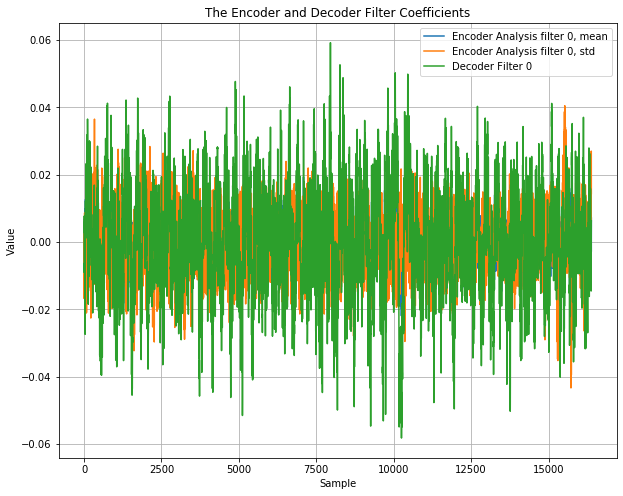

In [21]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [22]:
#Test on training set:
    
Yencmean=model.encodermean(X)
    
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) 
print("predictions.shape=", predictions.shape)

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [23]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


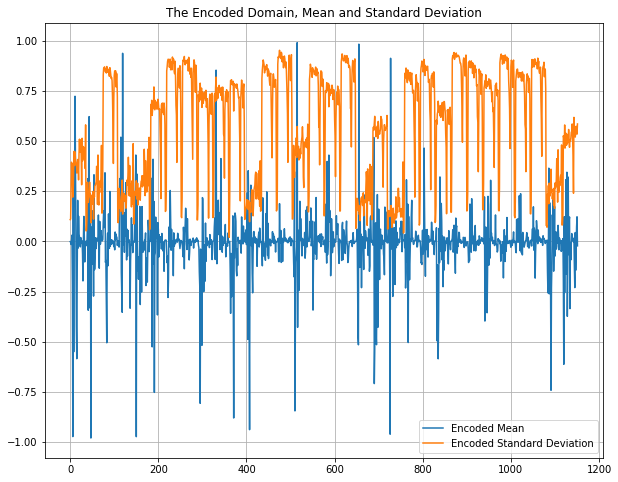

D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


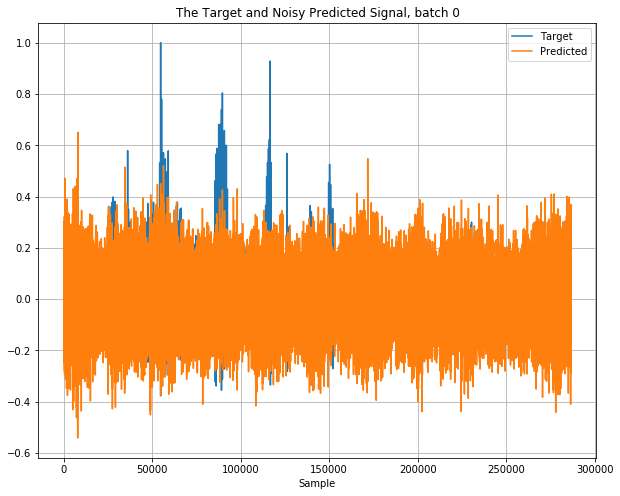

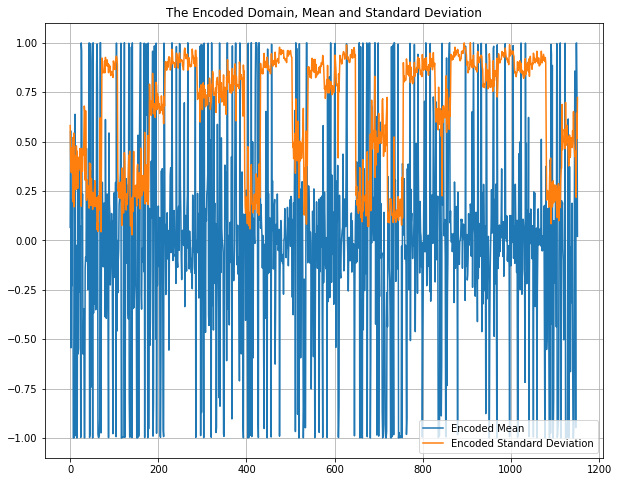

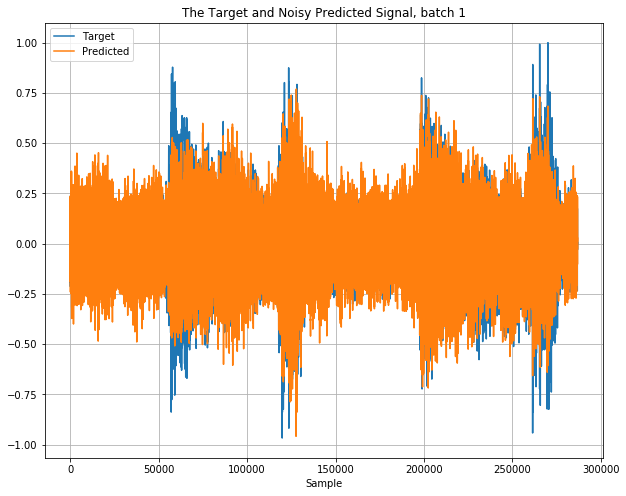

In [24]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    xrek=predclean[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


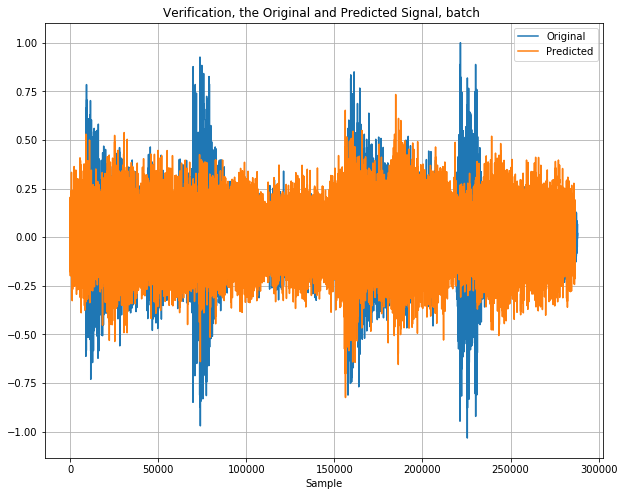

In [25]:
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() 
predclean=np.array(predclean)
    
xrek=predclean[0,0,:]  
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) 
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) 
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

Wykorzystanie stałego szumu ze standardową wariancją w procesie uczenia. Oznacza to, że nie potrzebujemy już "variational loss".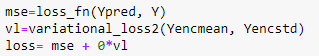

In [26]:
batch=2;
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) 
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 288000)
X.shape= torch.Size([2, 1, 288000])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [27]:
Ypred, Yencmean, Yencstd = model(X)
    
outputlen=len(Ypred[0,0,:]) 
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
randdir=False

outputlen= 286722
Input X.shape= torch.Size([2, 1, 288000])
Target Y.shape= torch.Size([2, 1, 286722])
Target Y= tensor([[[ 4.6740e-05,  5.1414e-04,  4.6740e-04,  ..., -1.8229e-03,
          -2.2435e-03, -1.9163e-03]],

        [[ 2.2972e-03,  3.3140e-02,  7.2711e-02,  ..., -1.1406e-02,
          -4.9939e-04,  4.9340e-03]]])
Y.type()= torch.FloatTensor


In [28]:
if randdir==True:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
else:
    for epoch in range(2000):
        Yencmean=model.encodermean(X)
        Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0*vl
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.012380796484649181 variational loss= 0.0037954719737172127
10 mse= 0.012304781936109066 variational loss= 0.012634443119168282
20 mse= 0.012038858607411385 variational loss= 0.03629908338189125
30 mse= 0.011468875221908092 variational loss= 0.08335664123296738
40 mse= 0.010887786746025085 variational loss= 0.13511131703853607
50 mse= 0.01048259623348713 variational loss= 0.1772492527961731
60 mse= 0.009795190766453743 variational loss= 0.20930303633213043
70 mse= 0.009288603439927101 variational loss= 0.2339693158864975
80 mse= 0.008746786043047905 variational loss= 0.25382864475250244
90 mse= 0.008549862541258335 variational loss= 0.27031445503234863
100 mse= 0.00806382391601801 variational loss= 0.2852478623390198
110 mse= 0.007782823871821165 variational loss= 0.2979879677295685
120 mse= 0.00787271372973919 variational loss= 0.31045258045196533
130 mse= 0.007725834380835295 variational loss= 0.32224041223526
140 mse= 0.007438383996486664 variational loss= 0.3343697190284729

1220 mse= 0.005898389965295792 variational loss= 0.7090941667556763
1230 mse= 0.005655466113239527 variational loss= 0.7100080847740173
1240 mse= 0.006068120244890451 variational loss= 0.711000382900238
1250 mse= 0.005900464951992035 variational loss= 0.7120368480682373
1260 mse= 0.005873080808669329 variational loss= 0.7130455374717712
1270 mse= 0.006094678770750761 variational loss= 0.7138851881027222
1280 mse= 0.00598160782828927 variational loss= 0.7147277593612671
1290 mse= 0.005405731964856386 variational loss= 0.7153573036193848
1300 mse= 0.006031088065356016 variational loss= 0.7162670493125916
1310 mse= 0.006184290628880262 variational loss= 0.7170366644859314
1320 mse= 0.0056701404973864555 variational loss= 0.717758059501648
1330 mse= 0.005568293388932943 variational loss= 0.7185990810394287
1340 mse= 0.006086769513785839 variational loss= 0.7194191217422485
1350 mse= 0.006101973354816437 variational loss= 0.7200644016265869
1360 mse= 0.006371769588440657 variational loss= 0

MSE= 0.005552245303988457 Variational Loss: 0.37935277819633484
ww= OrderedDict([('conv1mean.weight', tensor([[[-0.0205, -0.0194, -0.0199,  ...,  0.0207,  0.0204,  0.0240]],

        [[-0.0073, -0.0065, -0.0051,  ...,  0.0007,  0.0134,  0.0090]],

        [[ 0.0054,  0.0142,  0.0188,  ...,  0.0027,  0.0064,  0.0050]],

        ...,

        [[ 0.0015,  0.0025, -0.0119,  ...,  0.0018, -0.0003,  0.0105]],

        [[-0.0198, -0.0089, -0.0153,  ...,  0.0157,  0.0260,  0.0152]],

        [[-0.0068, -0.0071, -0.0066,  ...,  0.0113, -0.0014,  0.0034]]])), ('conv1mean.bias', tensor([ 0.0074,  0.0003, -0.0033, -0.0054, -0.0036,  0.0112, -0.0032,  0.0036,
         0.0120, -0.0172, -0.0162,  0.0108, -0.0042, -0.0029,  0.0041,  0.0128,
        -0.0159, -0.0043,  0.0136,  0.0105,  0.0186,  0.0021,  0.0124, -0.0173,
        -0.0005,  0.0078,  0.0160,  0.0025,  0.0106,  0.0047,  0.0028, -0.0001])), ('conv1std.weight', tensor([[[-0.0008, -0.0023,  0.0063,  ...,  0.0013, -0.0016, -0.0072]],

        [

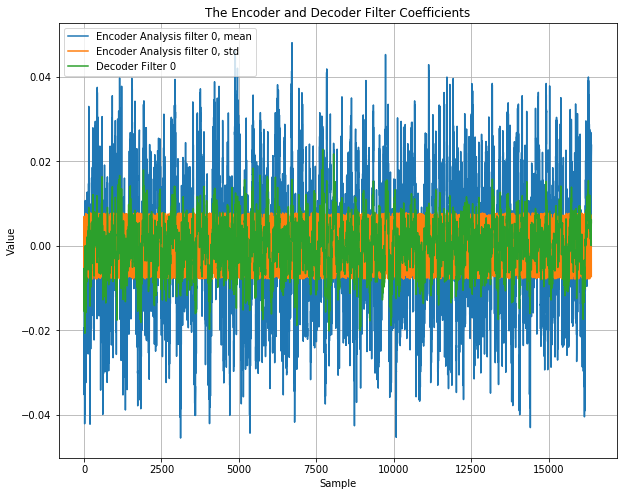

In [29]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [30]:
Yencmean=model.encodermean(X)
    
predclean=model.decoder(Yencmean)
predclean=predclean.detach() 
predclean=np.array(predclean)
    
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) 
print("predictions.shape=", predictions.shape)

Yencstd.shape= (2, 32, 36)
predictions.shape= (2, 1, 286722)


In [31]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


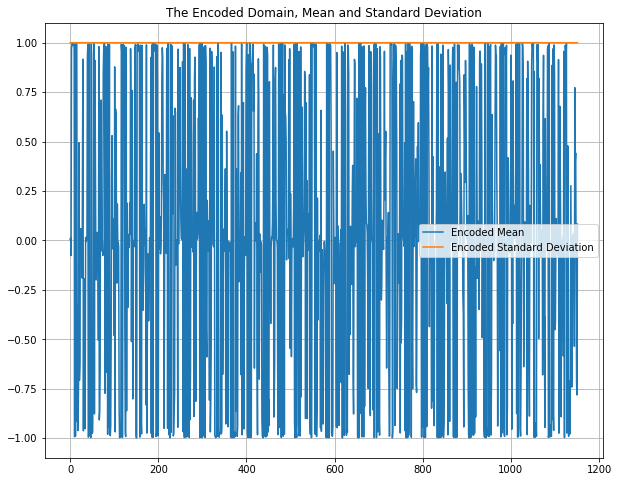

D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


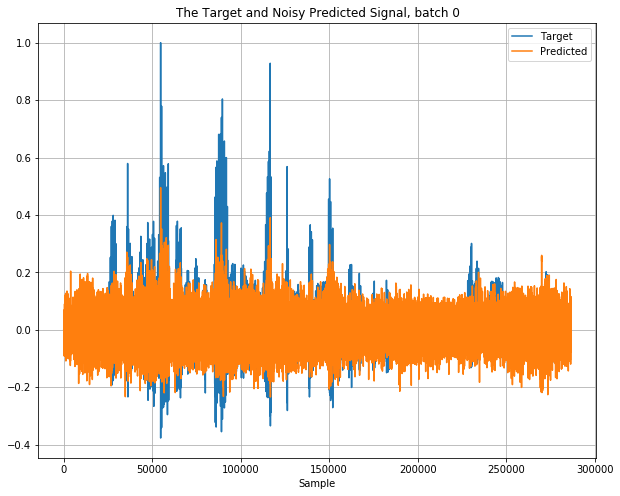

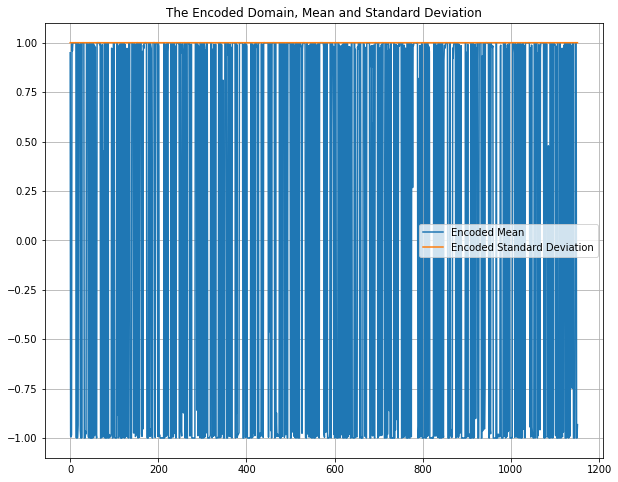

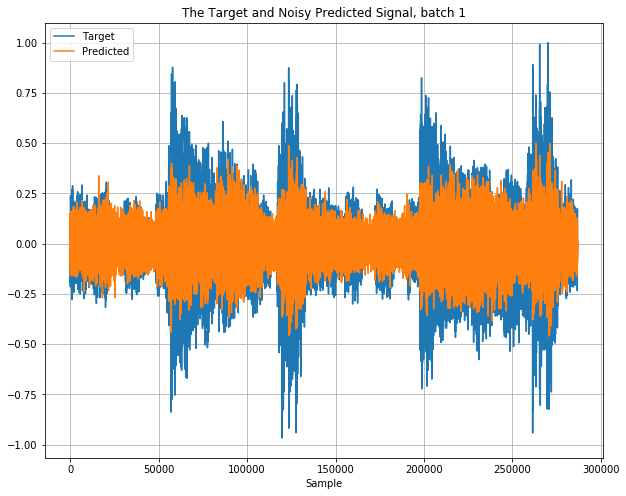

In [32]:
for b in range(batch):
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    xrek=predclean[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

D:\Anaconda\Anaconda\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


D:\Anaconda\Anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


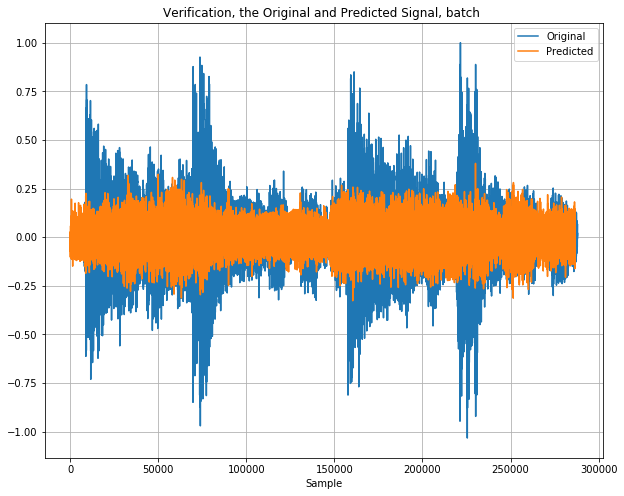

In [33]:
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() 
predclean=np.array(predclean)
    
xrek=predclean[0,0,:]  
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) 
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) 
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

## Wnioski
Udało nam się stworzyć program, którym w pewnym stopniu potrafi "odszumić" dźwięk. W otrzymanym wyniku dalej możemy usłyszeć szumy, ale jest ich zdecydowanie mniej. W odszumionym dźwięku bez problemu możemy zrozumieć wypowiedziane słowa.
